Question 1

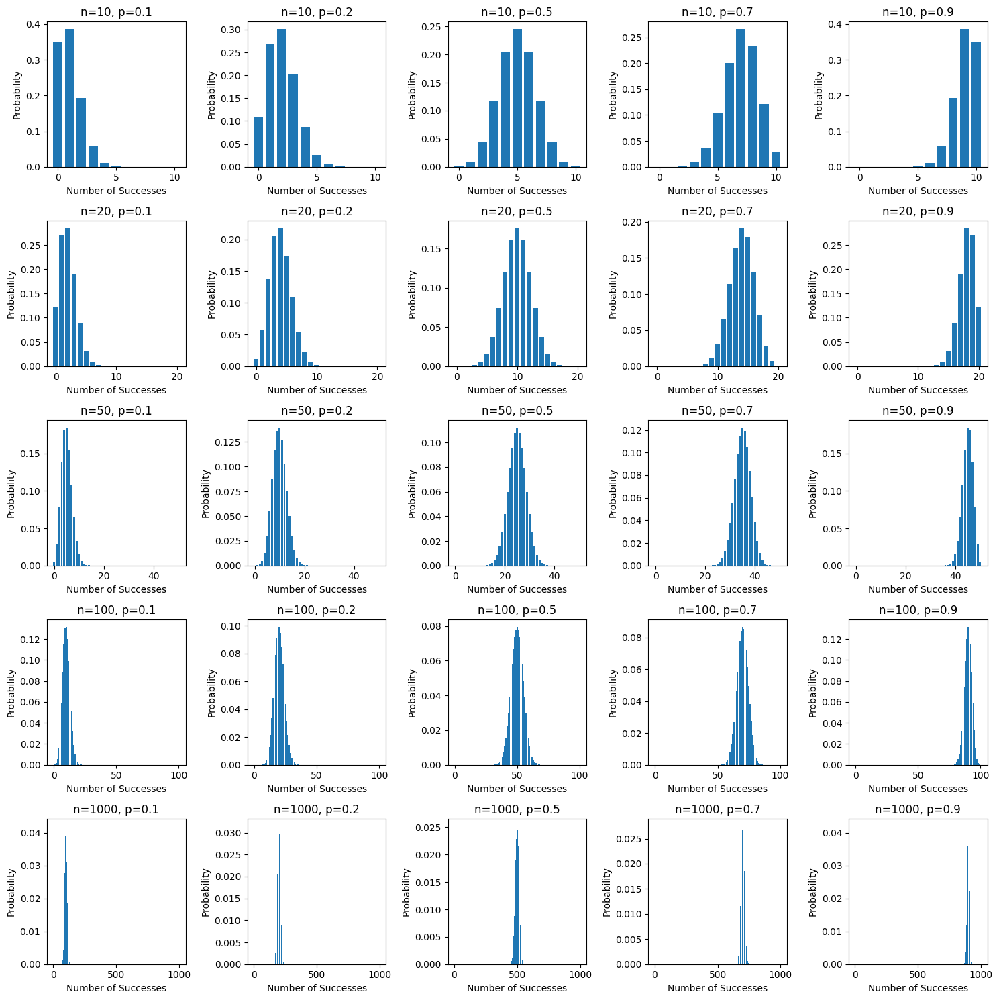

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st

probs = [0.1, 0.2, 0.5, 0.7, 0.9]
nums = [10, 20, 50, 100, 1000]  
#here we create a 5*5 figure to plot PMFs
fig, axes = plt.subplots(5, 5, figsize=(15, 15))

#here we just loop through probs and nums 
for i, n in enumerate(nums):
    for j, p in enumerate(probs):
        #x-axis
        x = np.arange(0, n+1)
        pmf_values = st.binom.pmf(x, n, p)
        ax = axes[i, j]
        ax.bar(x, pmf_values, align='center')
        ax.set_title(f'n={n}, p={p}')
        ax.set_xlabel('Number of Successes')
        ax.set_ylabel('Probability')

plt.tight_layout()
plt.show()

Question 2

In [40]:
import random
#in this question we use random library to create random nums between 1 and 10
#then we sum all these random nums
count = 0
for i in range(10000):
    sum = 0
    for j in range(79):
        sum += random.randint(1, 10)
    if sum < 301:
        count+=1

float(count)/10000

0.0

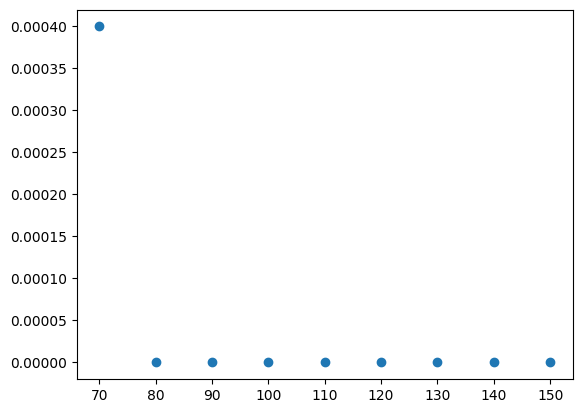

In [41]:
#here we do the same thing we did in previous part
probs = []
for j in range(70,151,10):
    count = 0
    for i in range(10000):
        sum = 0
        for k in range(j-1):
            sum += random.randint(1,10)
        if sum < 301:
            count += 1
    probs.append(float(count)/10000)
x = list(range(70,151,10))
plt.scatter(x, probs)
plt.show()

Question 3

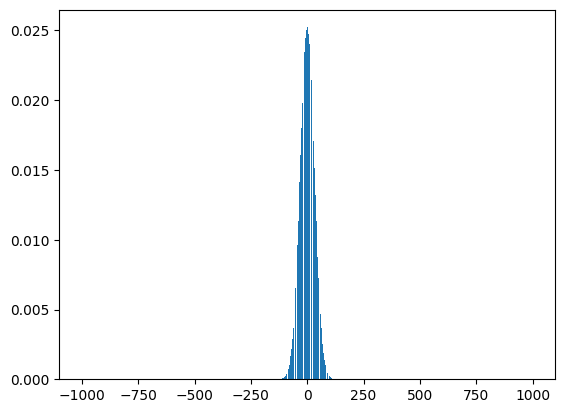

In [30]:
import scipy.special as spc
#here to plot PMF we use scipy.special.comb() 
z_vals = np.arange(-1000,1001)
n = 1000
pmf = [spc.comb(n, (n+z)//2) * (0.5**n) for z in z_vals]
plt.bar(z_vals, pmf, align='center')
plt.show()

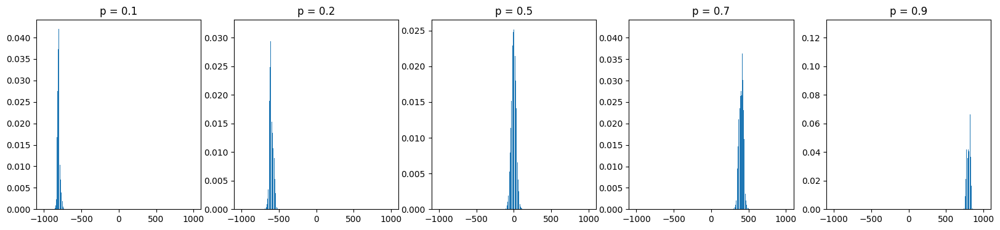

In [35]:
probs = [0.1, 0.2, 0.5, 0.7, 0.9]
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
#here we plot the PMF for different values of p
for i in range(5):
    pmf_values = [spc.comb(n, (n+z)//2) * probs[i]**((n+z)/2) * (1-probs[i])**((n-z)/2) for z in z_vals]
    ax = axes[i]
    ax.bar(z_vals, pmf_values, align='center')
    ax.set_title(f'p = {probs[i]}')


In [37]:
#here we define a function to find the Mean position after 10000 steps
def mean(N,prob):
    pos = []
    for i in range(N):
        pos.append(np.sum(np.random.choice([-1,1], size=10000, p=[1-prob, prob])))
    return np.mean(pos)
N = 10000
for p in probs:
    print(f'Mean position after 10000 steps with p = {p} is {mean(N,p)}')

Mean position after 10000 step with p = 0.1 is -7999.6902
Mean position after 10000 step with p = 0.2 is -5999.0114
Mean position after 10000 step with p = 0.5 is -1.684
Mean position after 10000 step with p = 0.7 is 4002.089
Mean position after 10000 step with p = 0.9 is 8000.0512


In [38]:
#now we increase the value of N
N = 100000
for p in probs:
    print(f'Mean position after 10000 step with p = {p} is {mean(N,p)}')

Mean position after 10000 step with p = 0.1 is -7999.93482
Mean position after 10000 step with p = 0.2 is -6000.25278
Mean position after 10000 step with p = 0.5 is -0.36236
Mean position after 10000 step with p = 0.7 is 3999.58712
Mean position after 10000 step with p = 0.9 is 8000.01598


Question 4

In [43]:
#here we define a function to find whether we stop in zoo or in park
#for the part that we want to pick something out of a sample space with specifc probabilities
#we use random.choice()
def stop_in_zoo_or_park(N):
    n_zoo = 0
    n_park = 0
    for i in range(N):
        pos = 0
        while True:
            x = np.random.choice([-1, 1], p=[0.5, 0.5])
            pos += x
            if pos == 2:
                n_zoo+=1
                break
            if pos == -1:
                n_park+=1
                break
    return [n_zoo, n_park]

ans = stop_in_zoo_or_park(100000)            
print('Number of times stoped in zoo: ', ans[0])
print('Number of times stoped in park: ', ans[-1])

Number of times stoped in zoo:  33513
Number of times stoped in park:  66487


Question 5

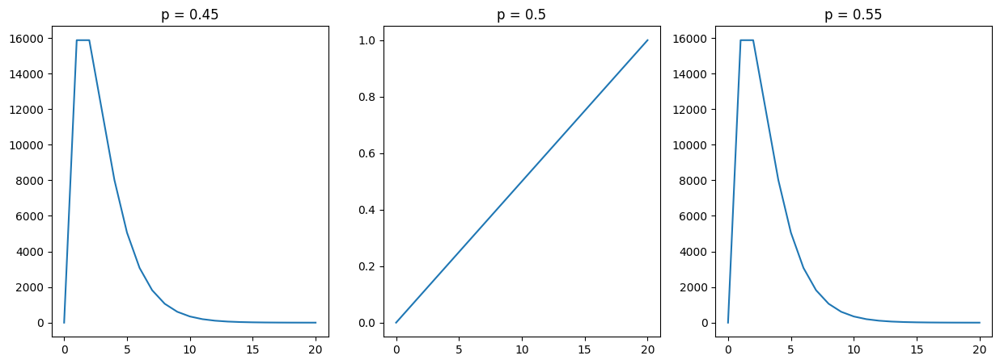

In [46]:
def exit(l, probs):
    n = np.arange(0,l+1)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    for i in range(3):
        ax = axes[i]
        ax.set_title(f'p = {probs[i]}')
        if(probs[i] == 0.5):
            P = n / l
            ax.plot(n, P)
        else:
            P = (probs[i]**n - (1-probs[i])**n) / (probs[i]**l - (1-probs[i])**l)
            ax.plot(n, P)

probs = [0.45, 0.5, 0.55]
exit(20, probs)

Question 6

In [86]:
def number_of_times_passing(k,n,prob):
    count = 0
    pos = 0
    for i in range(n):
        pos += np.random.choice([-1, 1], p=[1-prob, prob])
        if pos == k:
            count += 1
    return count
count = []
for i in range(1000):
    count.append(number_of_times_passing(2, 10000, 0.3))
print(f'Mean number of times passing from +2 after 10000 steps is ', np.mean(count))

Mean number of times passing from +2 after 10000 steps is  0.422


Question 7

In [82]:
def time_reaching_position(k, prob):
    pos = 0
    time = 0
    while True:
        time += 1
        pos += np.random.choice([-1, 1], p=[1-prob, prob])
        if pos == k:
            break
    return time
time = []
for i in range(10000):
    time.append(time_reaching_position(50, 0.55))
print(f'Mean time reaching position k is', np.mean(time))

Mean time reaching position k is 502.9958


Question 8

In [45]:
n = [10, 20, 50, 100, 200]
N = 10000
z0 = 100
count = []

for i in n:
    c = 0
    for j in range(N):
        pos = z0
        pos += np.sum(np.random.normal(0, 1, size=i))
        if(pos > 105):
            c += 1
    count.append(c)
print(count)

[536, 1337, 2401, 2993, 3599]


Question 9

In [46]:
count = 0
for i in range(1000):
    pos = 0
    for j in range(100):
        pos += np.random.normal(5, 1)
        if(pos <= 0):
            count += 1
            break
print((1000-count)/1000)

1.0


In [48]:
count = 0
for i in range(1000):
    pos = 0
    for j in range(100):
        pos += np.random.normal(2, np.sqrt(5))
        if(pos <= 0):
            count += 1
            break
print((1000-count)/1000)

0.741


In [50]:
count = 0
res = []
for i in range(1000):
    pos = 0
    s = []
    for j in range(100):
        a = np.random.normal(5, 1)
        pos += a
        s.append(pos)
    res.append(len(set(s)))
print(np.sum(res)/(100000))

1.0


In [51]:
count = 0
res = []
for i in range(1000):
    pos = 0
    s = []
    for j in range(100):
        a = np.random.normal(2, np.sqrt(5))
        pos += a
        s.append(pos)
    res.append(len(set(s)))
print(np.sum(res)/(100000))

1.0


Question 10

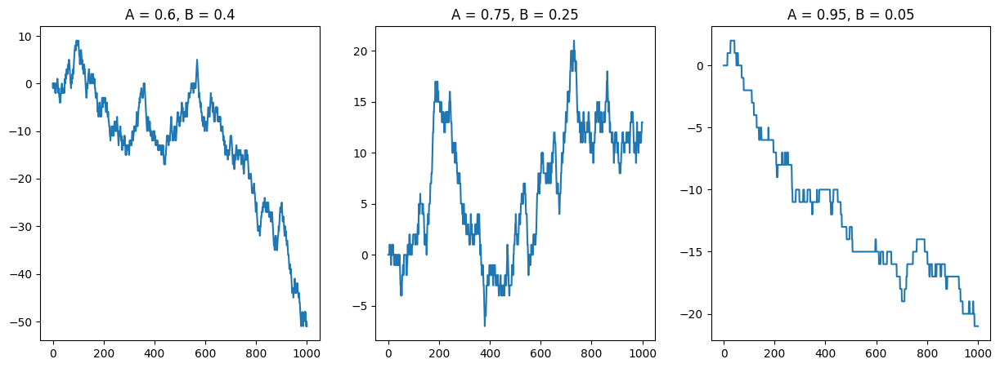

In [90]:
def Uniform_move(vals, n):
    a = len(vals)
    
    fig, axes = plt.subplots(1, a, figsize=(a * 5, 5))

    for i in range(a):
        ax = axes[i]
        ax.set_title(f'A = {vals[i][0]}, B = {vals[i][-1]}')
        pos = np.zeros(n+1)
        for j in range(1,n+1):
            Y = np.random.uniform(0, 1)
            if Y >= vals[i][0]:
                pos[j] = pos[j-1] + 1
            elif Y <= vals[i][-1]:
                pos[j] = pos[j-1] - 1
            else:
                pos[j] = pos[j-1]
        ax.plot(range(n+1), pos)

vals = [[0.6, 0.4], [0.75, 0.25], [0.95, 0.05]]
Uniform_move(vals, 1000)

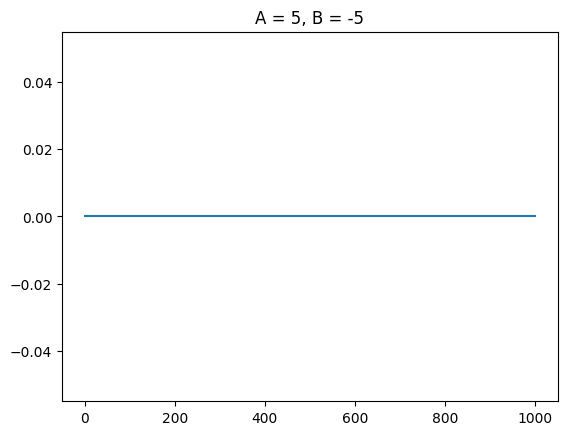

In [93]:
def Gaussian_move(vals, n, mean, variance):
    a = len(vals)
    for i in range(a):
        plt.title(f'A = {vals[i][0]}, B = {vals[i][-1]}')
        pos = np.zeros(n+1)
        for j in range(1,n+1):
            Y = np.random.normal(mean, np.sqrt(variance))
            if Y >= vals[i][0]:
                pos[j] = pos[j-1] + 1
            elif Y <= vals[i][-1]:
                pos[j] = pos[j-1] - 1
            else:
                pos[j] = pos[j-1]
        plt.plot(range(n+1), pos)

vals = [[5, -5]]
Gaussian_move(vals, 1000, 0, 1)

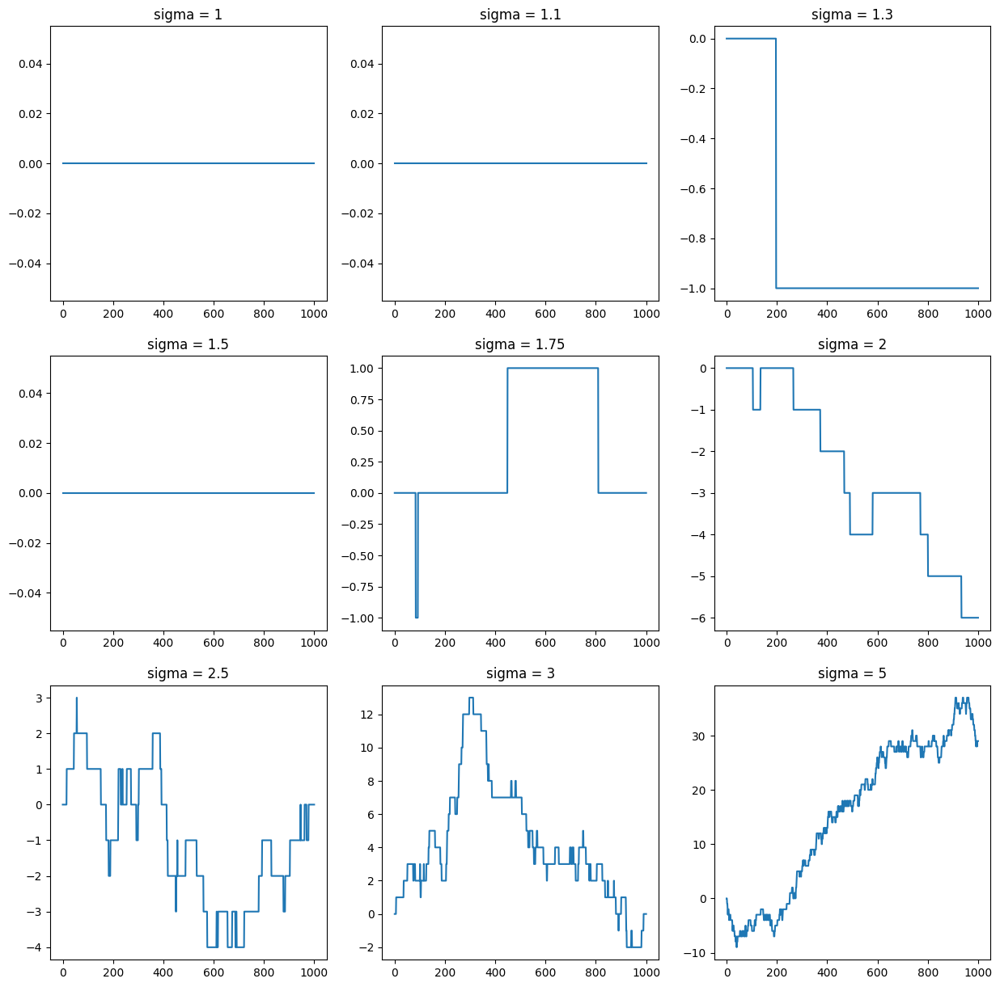

In [103]:
def Gaussian_move_variance(vars, n, mean):
    a = len(vars)

    fig, axes = plt.subplots(3, a//3, figsize=((a//3) * 5, 15))

    for i in range(a):
        ax = axes[i//3][i%3]
        ax.set_title(f'sigma = {vars[i]}')
        pos = np.zeros(n+1)
        for j in range(1,n+1):
            Y = np.random.normal(mean, vars[i])
            if Y >= 5:
                pos[j] = pos[j-1] + 1
            elif Y <= -5:
                pos[j] = pos[j-1] - 1
            else:
                pos[j] = pos[j-1]
        ax.plot(range(n+1), pos)

vars = [1, 1.1, 1.3, 1.5, 1.75, 2, 2.5, 3, 5]
Gaussian_move_variance(vars, 1000, 0)

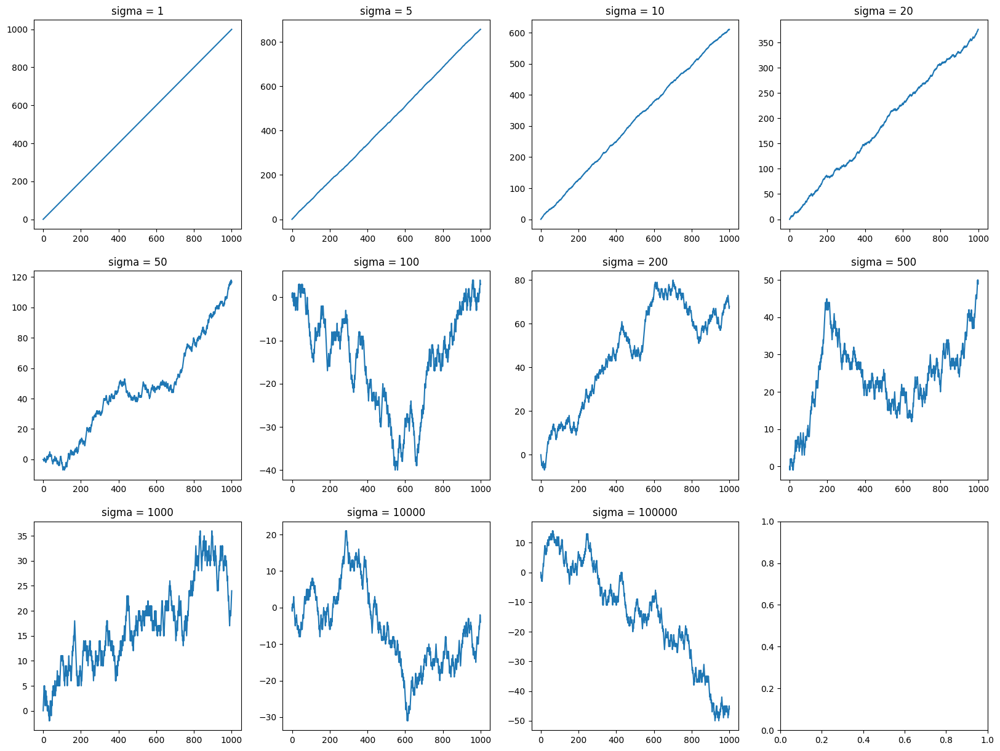

In [108]:
def Gaussian_move_variance(vars, n, mean):
    a = len(vars)

    fig, axes = plt.subplots(3, a//3 + 1, figsize=((a//3 + 1) * 5, 15))

    for i in range(a):
        ax = axes[i//4][i%4]
        ax.set_title(f'sigma = {vars[i]}')
        pos = np.zeros(n+1)
        for j in range(1,n+1):
            Y = np.random.normal(mean, vars[i])
            if Y >= 5:
                pos[j] = pos[j-1] + 1
            elif Y <= -5:
                pos[j] = pos[j-1] - 1
            else:
                pos[j] = pos[j-1]
        ax.plot(range(n+1), pos)
vars = [1, 5, 10, 20, 50, 100, 200, 500, 1000, 10000, 100000]
Gaussian_move_variance(vars, 1000, 10)

Question 11

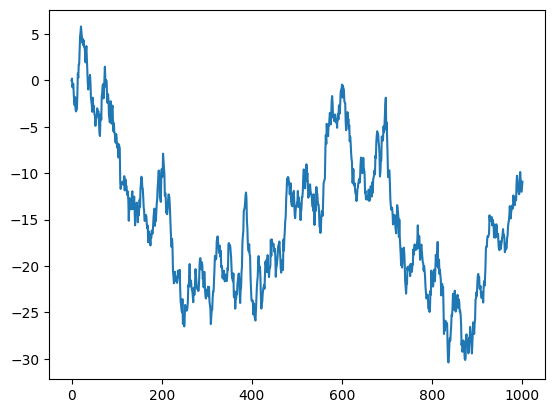

In [110]:
n = 1000
pos = np.zeros(n+1)
for i in range(1, n+1):
    x = np.random.normal(0, 1)
    pos[i] = pos[i-1] + x

plt.plot(range(n+1), pos)
plt.show()

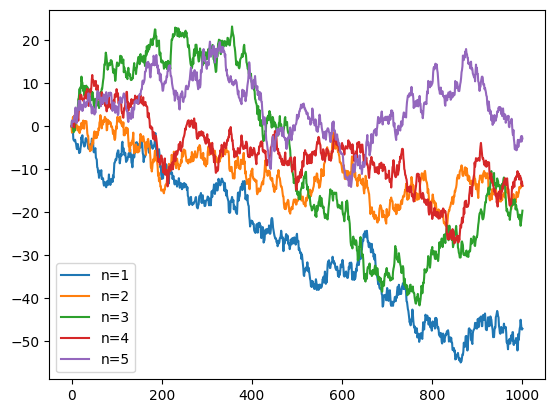

In [112]:
for i in range(5):
    pos = np.zeros(n+1)
    for j in range(1, n+1):
        x = np.random.normal(0, 1)
        pos[j] = pos[j-1] + x
    plt.plot(range(n+1), pos, label=f'n={i+1}')
plt.legend()
plt.show()

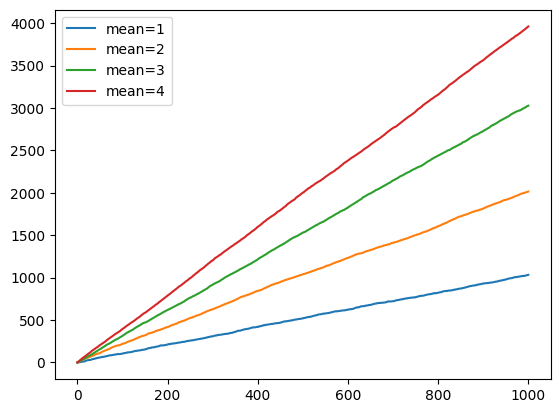

In [113]:
means = [1, 2, 3, 4]
for i in means:
    pos = np.zeros(n+1)
    for j in range(1, n+1):
        x = np.random.normal(i, 1)
        pos[j] = pos[j-1] + x
    plt.plot(range(n+1), pos, label=f'mean={i}')
plt.legend()
plt.show()


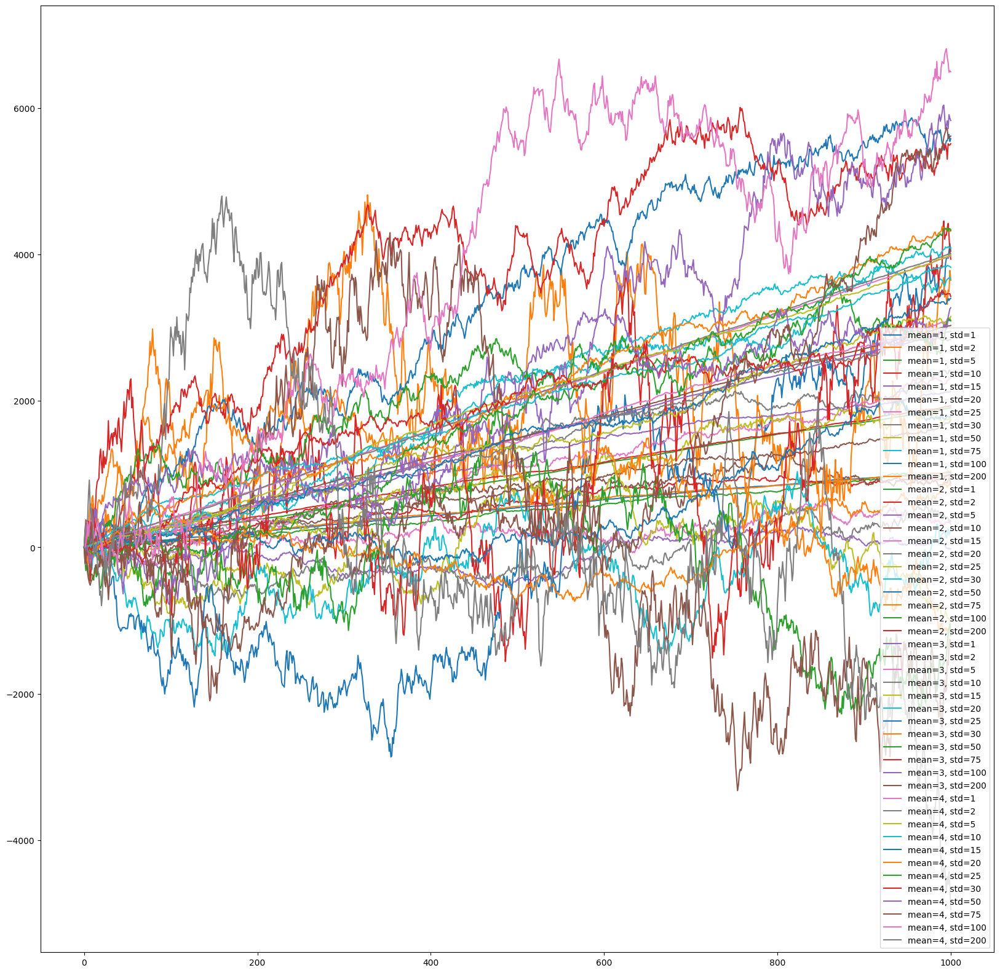

In [118]:
vars = [1, 2, 5, 10, 15, 20, 25, 30, 50, 75, 100, 200]
plt.figure(figsize=(20, 20))
for m in means:
    for v in vars:
        for j in range(1, n+1):
            x = np.random.normal(m, v)
            pos[j] = pos[j-1] + x
        plt.plot(range(n+1), pos, label=f'mean={m}, std={v}')

plt.legend()
plt.show()     

Question 12

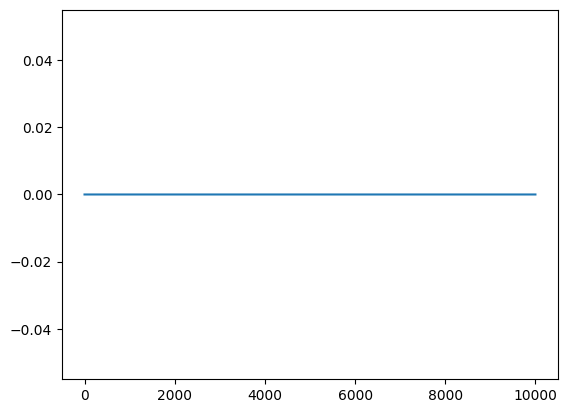

In [121]:
n = 10000
pos = np.zeros(n+1)
for i in range(1, n+1):
    x = np.random.gamma(shape=0, scale=1)
    pos[i] = pos[i-1] + x

plt.plot(range(n+1), pos)
plt.show()

In [122]:
#the result is as same as above there is no need to replot the shape above

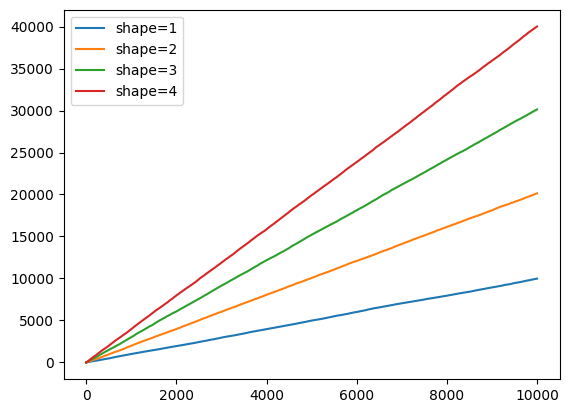

In [123]:
shapes = [1, 2, 3, 4]
for i in shapes:
    pos = np.zeros(n+1)
    for j in range(1, n+1):
        x = np.random.gamma(shape=i, scale=1)
        pos[j] = pos[j-1] + x
    plt.plot(range(n+1), pos, label=f'shape={i}')
plt.legend()
plt.show()

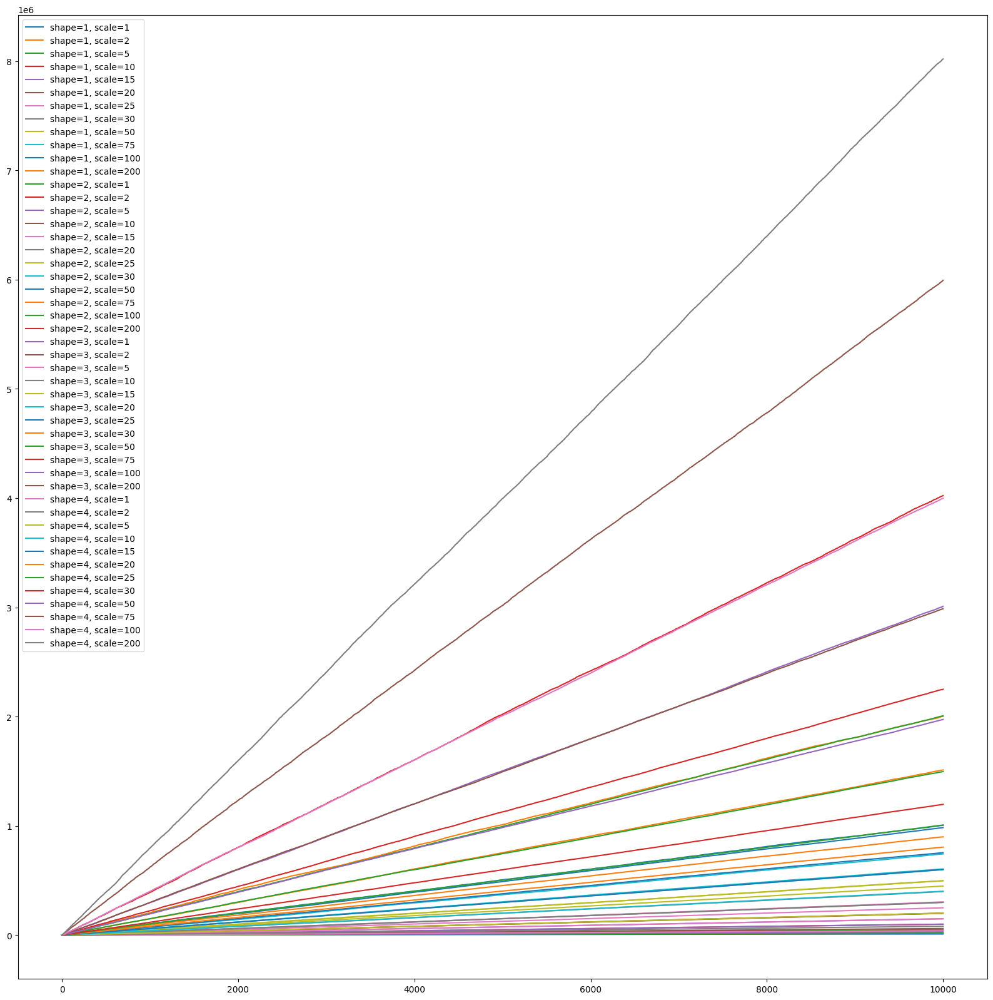

In [124]:
vars = [1, 2, 5, 10, 15, 20, 25, 30, 50, 75, 100, 200]
plt.figure(figsize=(20, 20))
for m in means:
    for v in vars:
        for j in range(1, n+1):
            x = np.random.gamma(m, v)
            pos[j] = pos[j-1] + x
        plt.plot(range(n+1), pos, label=f'shape={m}, scale={v}')

plt.legend()
plt.show()     

Question 13

In [4]:
def check_origin(n,prob):
    count = 0
    pos = 0
    for i in range(n):
        pos += np.random.choice([1, -1], p=[prob, 1-prob])
        if pos == 0:
            count += 1
    return count
count = []
for i in range(10000):
    count.append(check_origin(100, 0.5))
print(f'Probability of getting back to origin is ', (len(count) - count.count(0))/10000)
print(f'Mean number of times that gets back to origin is ', np.mean(count))

Probability of getting back to origin is  0.919
Mean number of times that gets back to origin is  7.0434


In [5]:
#here we increase n to see the result
count = []
for i in range(10000):
    count.append(check_origin(1000, 0.5))
print(f'Probability of getting back to origin is ', (len(count) - count.count(0))/10000)
print(f'Mean number of times that gets back to origin is ', np.mean(count))

Probability of getting back to origin is  0.9741
Mean number of times that gets back to origin is  24.5106


In [6]:
#here we just change the value of p
count = []
for i in range(10000):
    count.append(check_origin(100, 0.6666667))
print(f'Probability of getting back to origin is ', (len(count) - count.count(0))/10000)
print(f'Mean number of times that gets back to origin is ', np.mean(count))

Probability of getting back to origin is  0.6661
Mean number of times that gets back to origin is  1.9974


In [7]:
count = []
for i in range(10000):
    count.append(check_origin(200, 0.6666667))
print(f'Probability of getting back to origin is ', (len(count) - count.count(0))/10000)
print(f'Mean number of times that gets back to origin is ', np.mean(count))

Probability of getting back to origin is  0.6554
Mean number of times that gets back to origin is  1.9522


Question 14

In [132]:
def Check_if_reached(n,l,h):
    pos = 0
    for i in range(n):
        pos += np.random.choice([1, -1], p=[0.5,0.5])
        if pos == l:
            return True
        elif pos == h:
            return False
for j in range(5,31,5):
    count = 0
    for i in range(1000):
        if Check_if_reached(1000, -1, j):
                count += 1
    print(f'Probability of reaching -1 earlier than {j} is ', count/1000)

Probability of reaching -1 earlier than 5 is  0.831
Probability of reaching -1 earlier than 10 is  0.91
Probability of reaching -1 earlier than 15 is  0.948
Probability of reaching -1 earlier than 20 is  0.954
Probability of reaching -1 earlier than 25 is  0.96
Probability of reaching -1 earlier than 30 is  0.958


Question 15

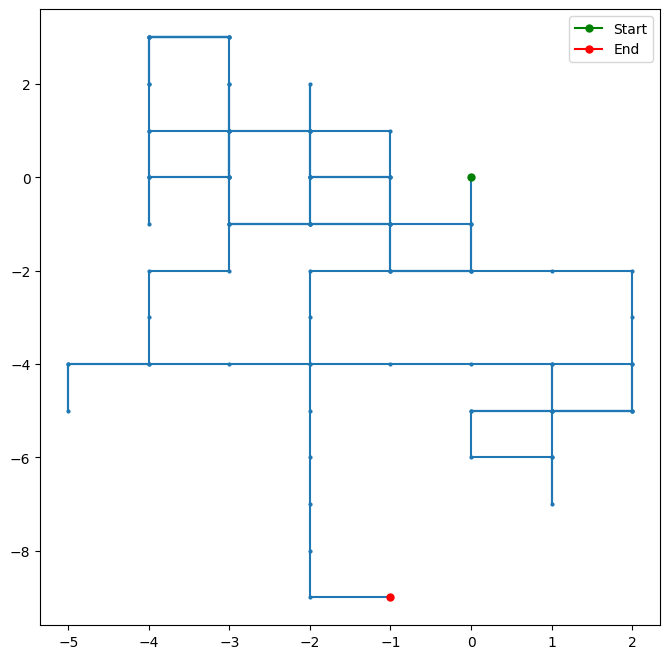

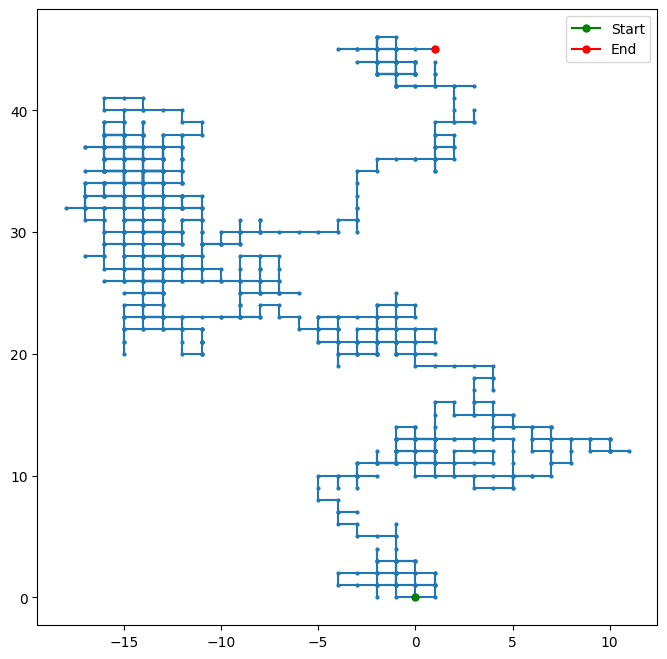

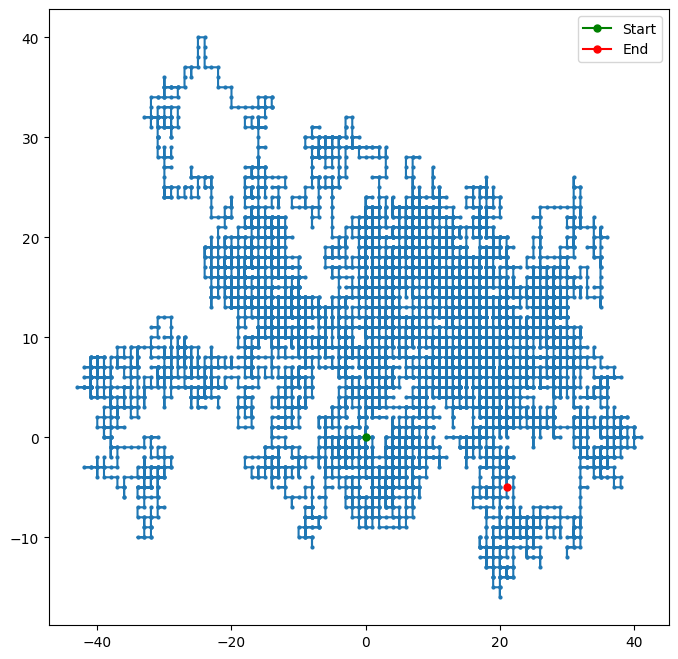

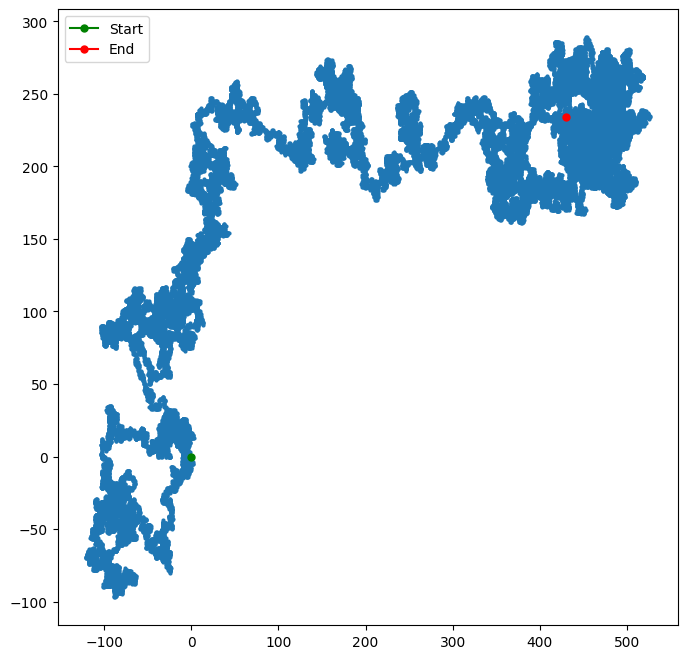

In [18]:
def random_walk_2D(n, dxdy):
    pos = np.zeros((n+1, 2))
    pos[0] = [0, 0]

    for i in range(1, n+1):
        x = dxdy[np.random.choice(len(dxdy), p=[1/len(dxdy) for i in range(len(dxdy))])]
        pos[i] = pos[i-1] + x

    plt.figure(figsize=(8, 8))
    plt.plot(pos[:, 0], pos[:, 1], linestyle='-', marker='o', markersize=2)
    plt.plot(pos[0][0], pos[0][1], marker='o', markersize=5, color='green', label='Start')
    plt.plot(pos[:, 0][-1], pos[:, 1][-1], marker='o', markersize=5, color='red', label='End')
    plt.legend()

n = [10**i for i in range(2, 6)]
dxdy = np.array([[1, 0], [-1, 0], [0, 1], [0, -1]])
for i in n:
    random_walk_2D(i, dxdy)

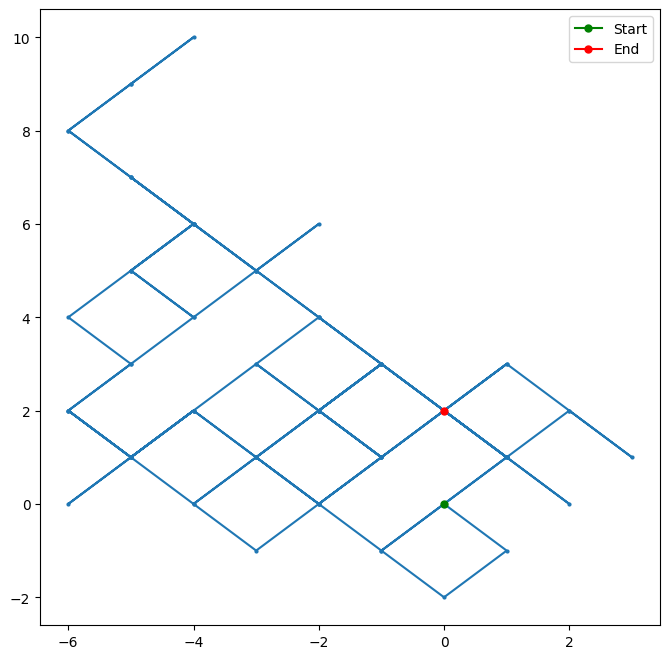

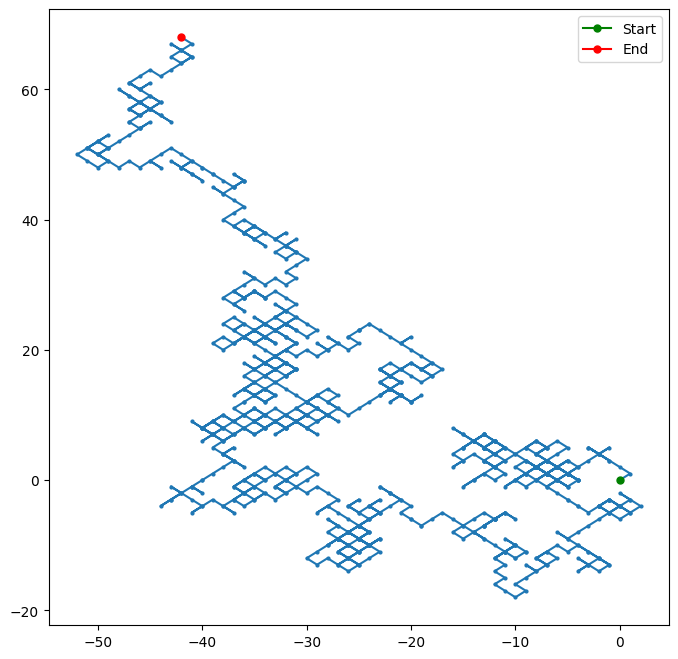

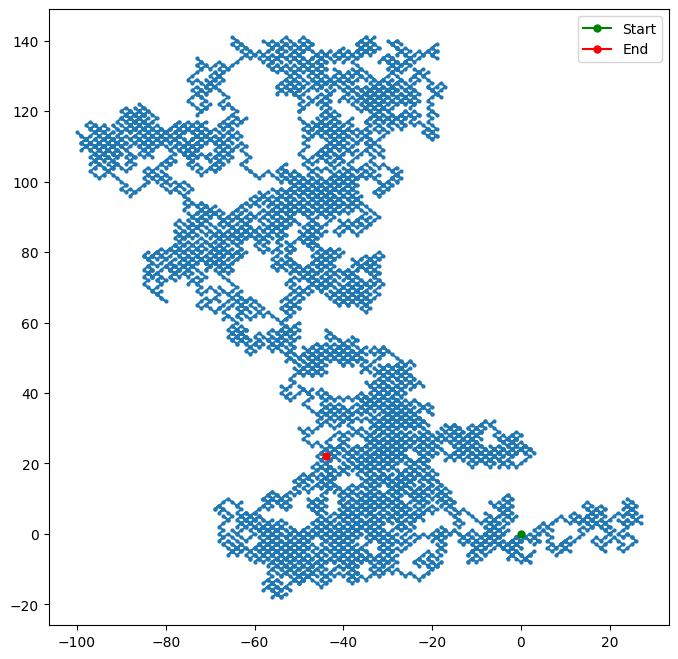

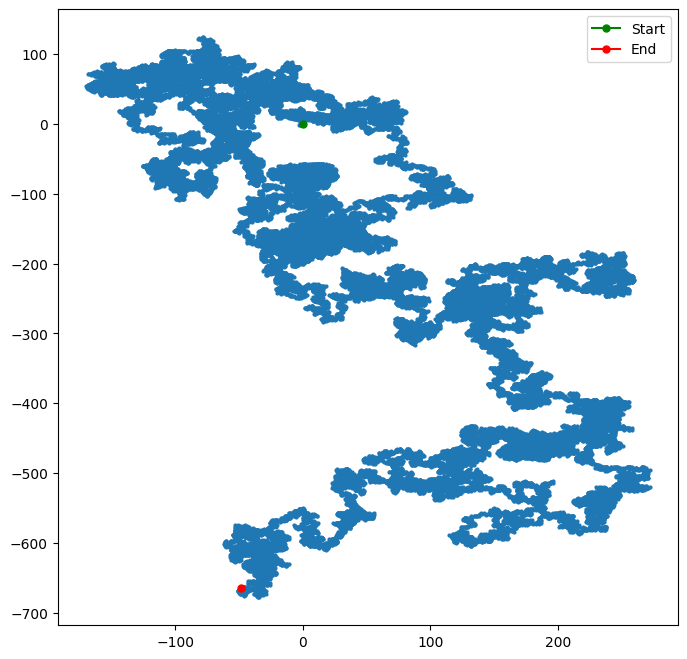

In [19]:
dxdy = [[1, 1], [-1, -1], [-1, 1], [1, -1]]
for i in n:
    random_walk_2D(i, dxdy)

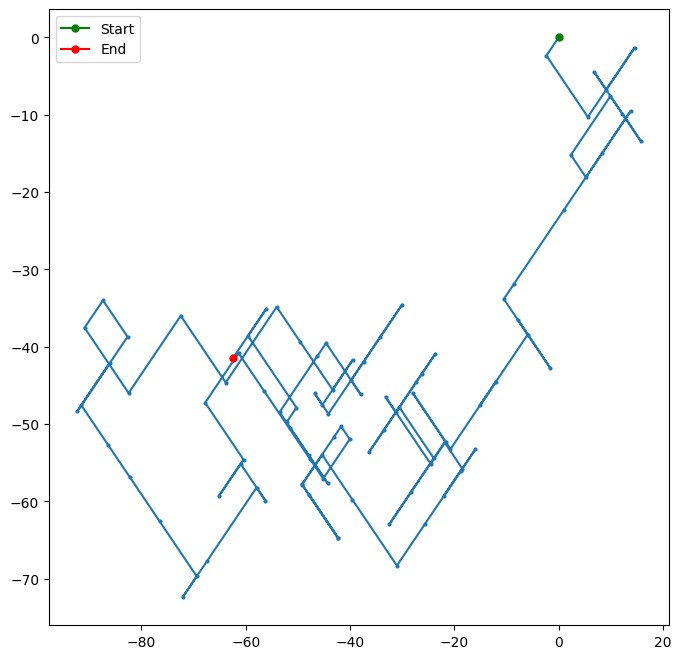

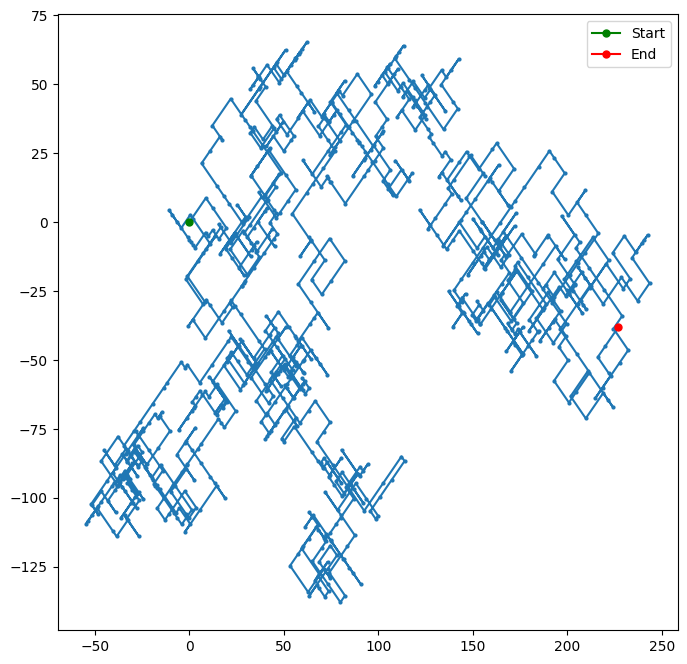

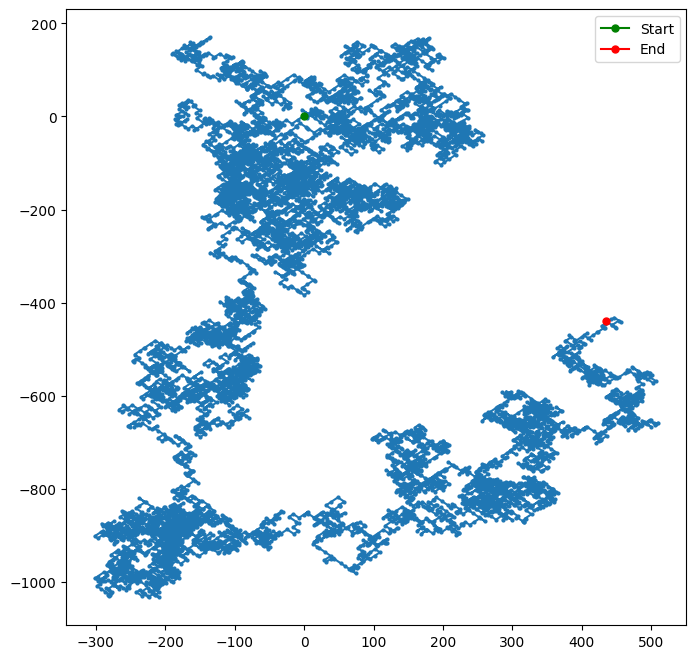

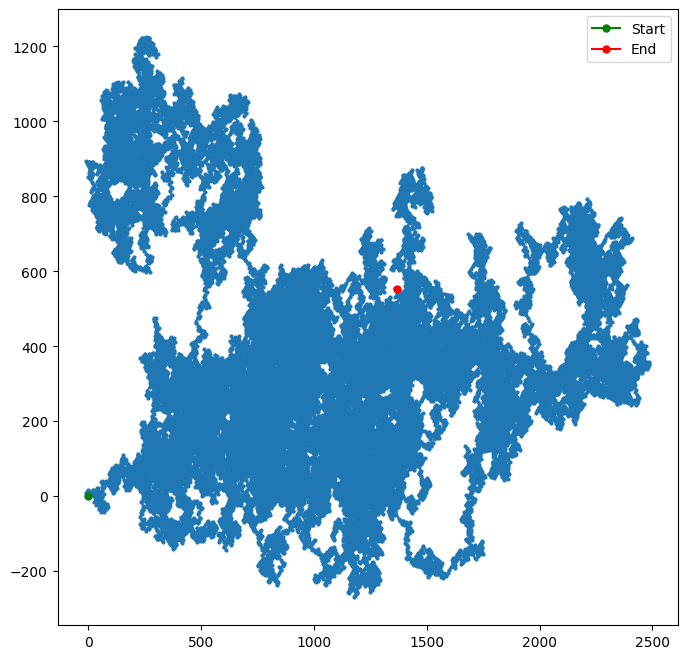

In [22]:
def random_walk_2D_uniform_step(n, dxdy):
    pos = np.zeros((n+1, 2))
    pos[0] = [0, 0]

    for i in range(1, n+1):
        k = np.random.uniform(1, 10)
        x = dxdy[np.random.choice(len(dxdy), p=[1/len(dxdy) for i in range(len(dxdy))])]
        pos[i] = pos[i-1] + x * k

    plt.figure(figsize=(8, 8))
    plt.plot(pos[:, 0], pos[:, 1], linestyle='-', marker='o', markersize=2)
    plt.plot(pos[0][0], pos[0][1], marker='o', markersize=5, color='green', label='Start')
    plt.plot(pos[:, 0][-1], pos[:, 1][-1], marker='o', markersize=5, color='red', label='End')
    plt.legend()
dxdy = np.array([[1, 1], [-1, -1], [-1, 1], [1, -1]])
for i in n:
    random_walk_2D_uniform_step(i, dxdy)


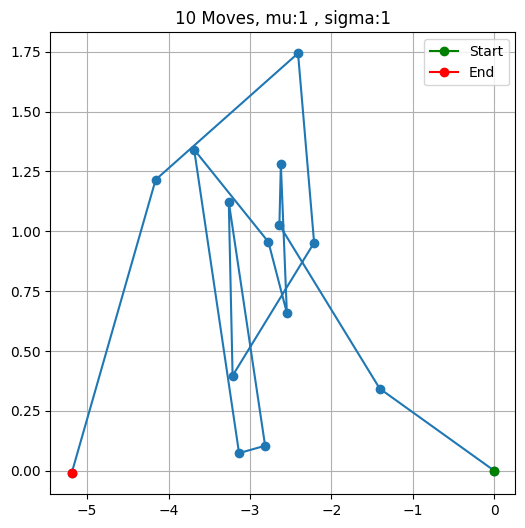

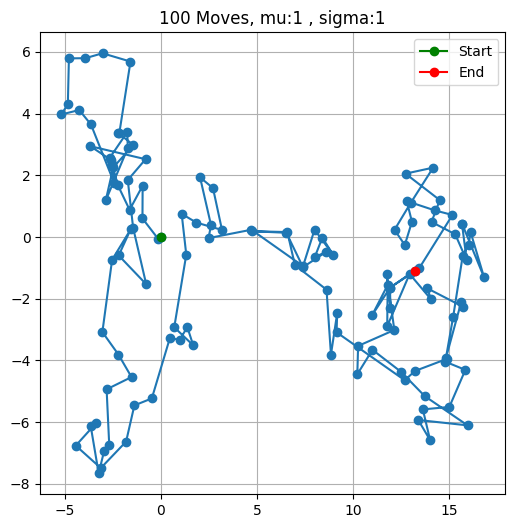

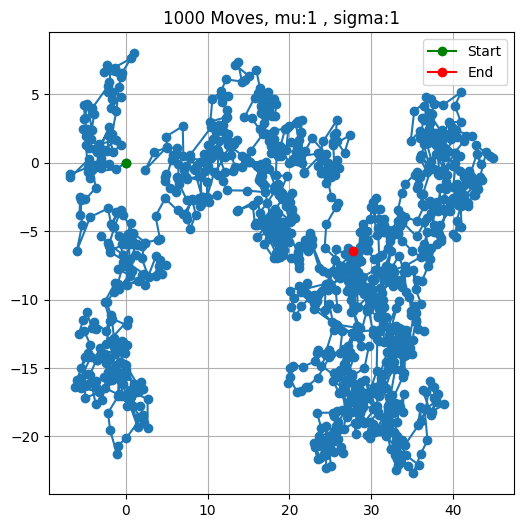

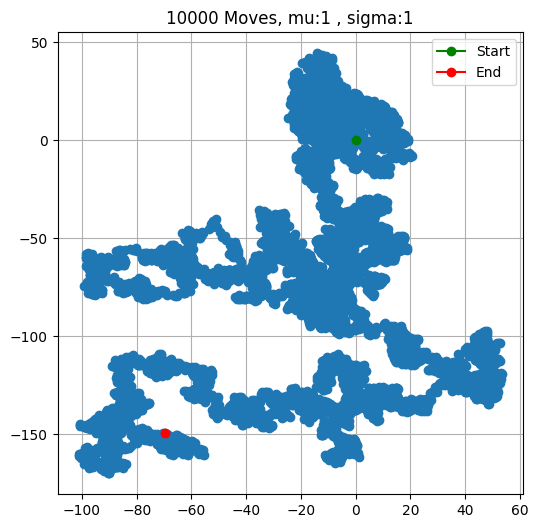

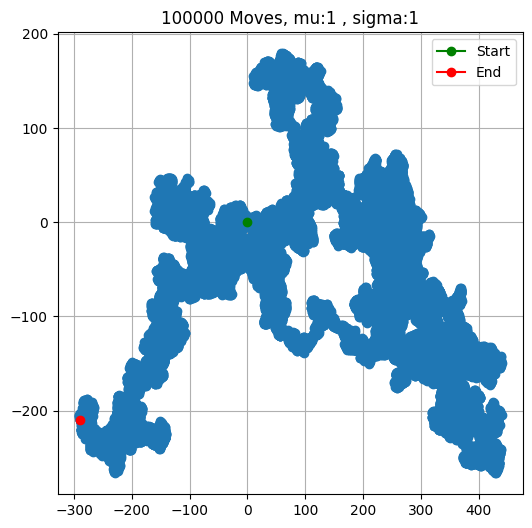

...

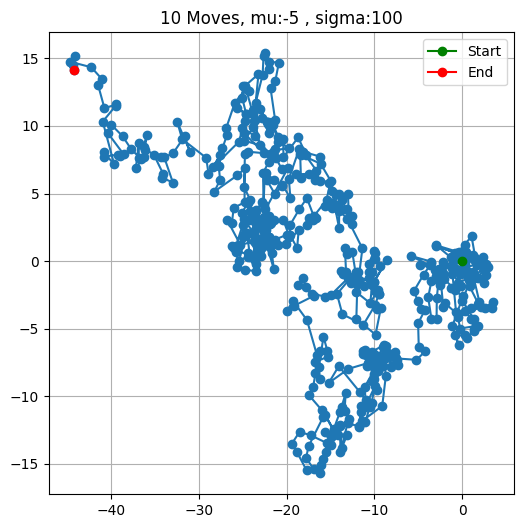

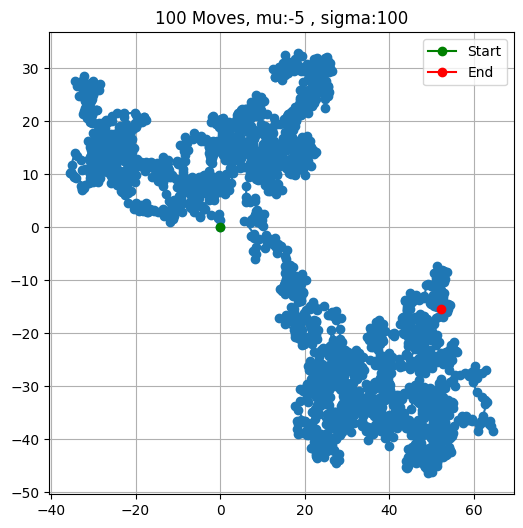

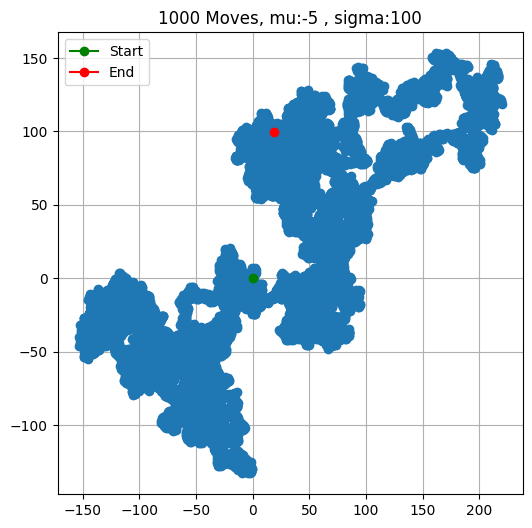

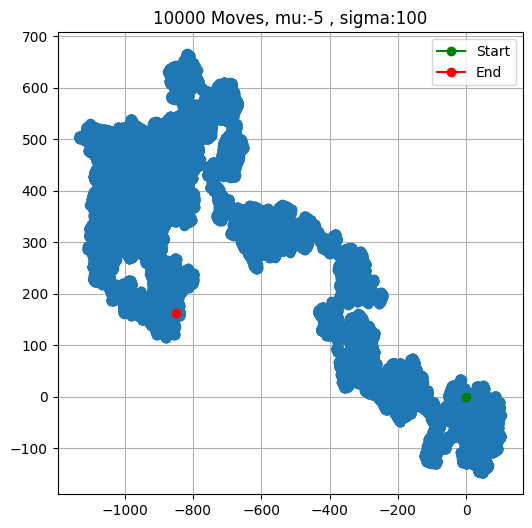

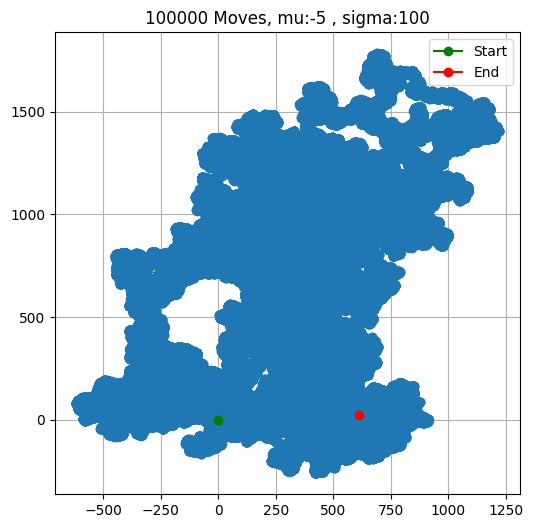

In [53]:
def simulate_movement(n, mu, sigma):
    positions = [np.array([0, 0])]
    for _ in range(n):
        num_steps = max(1, int(np.random.normal(mu, sigma)))  
        move = np.random.normal(0, 1, (num_steps, 2))
        new_positions = positions[-1] + np.cumsum(move, axis=0)
        positions.extend(new_positions.tolist())
    return np.array(positions)
def draw_position_diagram(num_moves, mu, sigma):
    positions = simulate_movement(num_moves, mu, sigma)
    plt.figure(figsize=(6,6))
    plt.plot(positions[:,0], positions[:,1], marker='o')
    plt.plot(positions[0,0], positions[0,1], marker='o', color='green', label='Start')
    plt.plot(positions[-1,0], positions[-1,1], marker='o', color='red', label='End')
    plt.title(f'{num_moves} Moves, mu:{mu} , sigma:{sigma}')
    plt.legend()
    plt.grid(True)
    plt.show()
mu_values = [1,-5]
sigma_values = [1, 2 , 5, 10,20,25,50,100]
for mu in mu_values:
    for sigma in sigma_values:
        draw_position_diagram(10, mu, sigma)
        draw_position_diagram(100, mu, sigma)
        draw_position_diagram(1000, mu, sigma)
        draw_position_diagram(10000, mu, sigma)
        draw_position_diagram(100000, mu, sigma)

Question 16

In [24]:
def random_walk_2D_back_to_origin(n, dxdy):
    pos = [0, 0]
    for i in range(n):
        pos += dxdy[np.random.choice(len(dxdy), p=[1/len(dxdy) for i in range(len(dxdy))])]
        if pos[0] == 0 and pos[1] == 0:
            return True
    return False
N = 1000
n = 1000
count = 0
dxdy = np.array([[1, 0], [-1, 0], [0, 1], [0, -1]])
for i in range(N):
    if random_walk_2D_back_to_origin(n, dxdy):
        count += 1
print(f'The probability of getting back to origin is {count/N}')

The probability of getting back to origin is 0.679


In [25]:
count = 0
dxdy = np.array([[1, 1], [-1, -1], [-1, 1], [1, -1]])
for i in range(N):
    if random_walk_2D_back_to_origin(n, dxdy):
        count += 1
print(f'The probability of getting back to origin is {count/N}')

The probability of getting back to origin is 0.668


Question 17

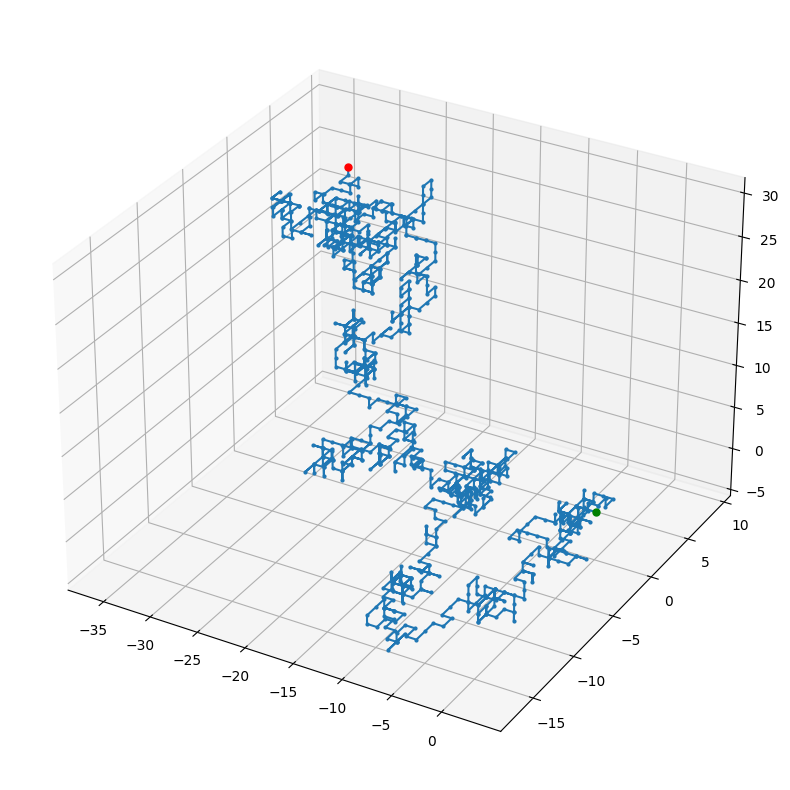

In [34]:
def random_walk_3D(n, dxdydz):
    pos = np.zeros((n+1, 3))
    pos[0] = [0, 0, 0]

    for i in range(1, n+1):
        x = dxdydz[np.random.choice(len(dxdydz), p=[1/len(dxdydz) for i in range(len(dxdydz))])]
        pos[i] = pos[i-1] + x
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(pos[:, 0], pos[:, 1], pos[:, 2], linestyle='-', marker='o', markersize=2)
    ax.plot(pos[0][0], pos[0][1], pos[0][2], marker='o', markersize=5, color='green')
    ax.plot(pos[-1][0], pos[-1][1], pos[-1][2], marker='o', markersize=5, color='red')

n = 1000
dxdydz = np.array([[1, 0, 0], [-1, 0, 0], [0, 1, 0], [0, -1, 0], [0, 0, 1], [0, 0, -1]])
random_walk_3D(n ,dxdydz)
    

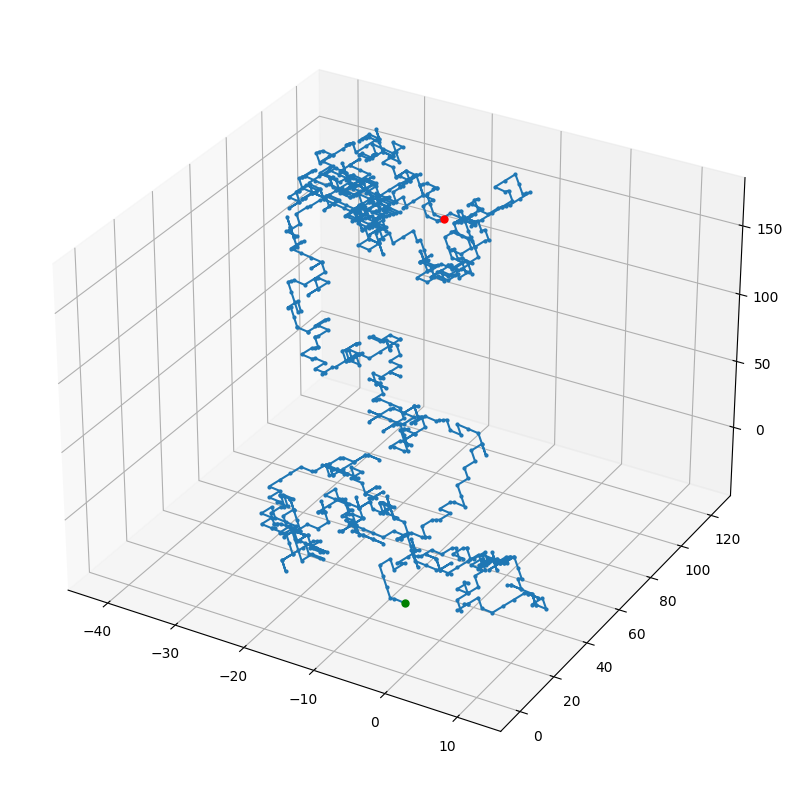

In [35]:
dxdydz = np.array([[1, 2, 4], [-1, 2, 4], [1, -2, 4], [1, 2, -4], [1, -2, -4], [-1, 2, -4], [-1, -2, 4], [-1, -2, -4]])
random_walk_3D(n ,dxdydz)

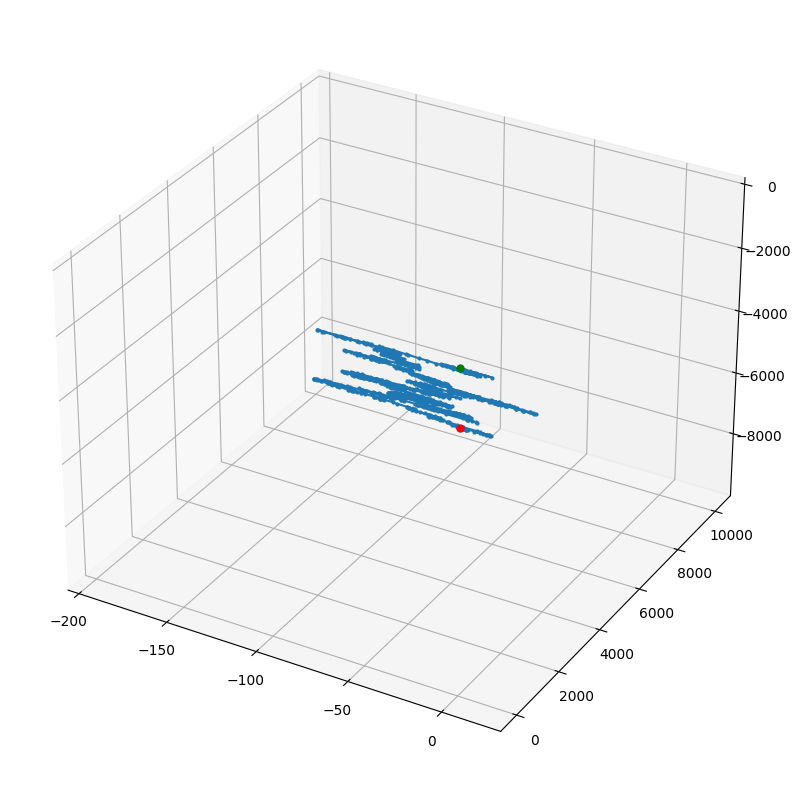

In [36]:
def random_walk_3D_arbitrary_distribution(n):
    pos = np.zeros((n+1, 3))
    pos[0] = [0, 0, 0]

    for i in range(1, n+1):
        x1 = np.random.normal(0, 4)
        x2 = np.random.gamma(2, 5)
        x3 = np.random.laplace(-10, 3)
        pos[i] = pos[i-1] + [x1, x2, x3]
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(pos[:, 0], pos[:, 1], pos[:, 2], linestyle='-', marker='o', markersize=2)
    ax.plot(pos[0][0], pos[0][1], pos[0][2], marker='o', markersize=5, color='green')
    ax.plot(pos[-1][0], pos[-1][1], pos[-1][2], marker='o', markersize=5, color='red')

n = 1000
random_walk_3D_arbitrary_distribution(n)

Question 18

In [37]:
def random_walk_3D_back_to_origin(n ,dxdydz):
    pos = [0, 0, 0]

    for i in range(n):
        pos += dxdydz[np.random.choice(len(dxdydz), p=[1/len(dxdydz) for i in range(len(dxdydz))])]
        if pos[0] == 0 and pos[1] == 0 and pos[-1] == 0:
            return True
    return False

N = 1000
n = 100
count = 0
dxdydz = np.array([[1, 1, 1], [1, 1, -1], [1, -1, 1], [-1, 1, 1], [1, -1, -1], [-1, -1, 1], [-1, 1, -1], [-1, -1, -1]])
for i in range(N):
    if random_walk_3D_back_to_origin(n ,dxdydz):
        count += 1

print(f'The probability of getting back to origin is {count/N}')

The probability of getting back to origin is 0.278


Question 19

In [ ]:
#According to the results of Q16 and Q18, we can see that the probability of returning to the origin
#in Q16 is much higher than Q18, becuase the degree of freedom in Q18 is higher and therefor the probability of getting far
#from origin becomes higher than Q16

Question 20

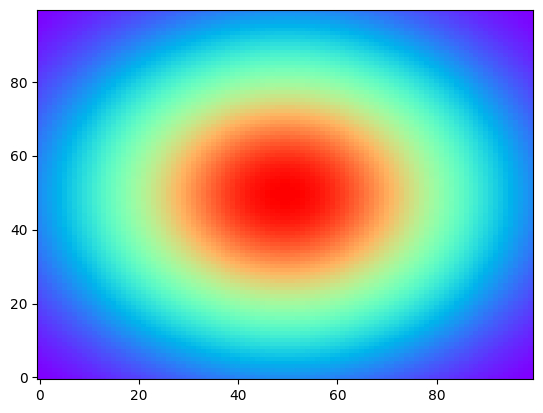

In [42]:
from matplotlib.animation import FuncAnimation
def update(time):
    ax.clear()

    mu_x, mu_y = 0, 0
    var_x, var_y = 5 + 0.5 * np.cos(1 * time), 5 + 0.5 * np.cos(1 * time)
    
    x = np.linspace(-4, 4, 100)
    y = np.linspace(-4, 4, 100)

    X, Y = np.meshgrid(x, y)

    Z = (np.exp(-(X - mu_x)**2 / (2 * var_x)) * np.exp(-(Y - mu_y)**2 / (2 * var_y)))

    ax.imshow(Z, cmap="rainbow", interpolation="nearest", origin="lower", aspect="auto")

fig, ax = plt.subplots()
animation = FuncAnimation(fig, update, frames=100, interval=100, repeat=False)
